<a href="https://colab.research.google.com/github/hungvo2003vn/Computer-Vision/blob/Ass2/Project_02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Kết nối với drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import os
print("Current working directory:", os.getcwd())

Current working directory: /content


In [3]:
# Set the new working directory
YOUR_PROJECT_LOCATION = '/content/drive/MyDrive/Colab Notebooks/Course Computer Vision/Assignment 2'
os.chdir(YOUR_PROJECT_LOCATION)

# Verify the change
print("Current working directory:", os.getcwd())

Current working directory: /content/drive/MyDrive/Colab Notebooks/Course Computer Vision/Assignment 2


In [4]:
# Chọn ảnh
image_path = os.getcwd() + '/Images/'

# Lấy toàn bộ tên ảnh ra
image_extensions = ['.jpg', '.jpeg', '.png', '.gif', '.bmp']
image_array = [file for file in os.listdir(image_path) if any(file.endswith(ext) for ext in image_extensions)]

# Verify ảnh
print('Path của thư mục ảnh: ', image_path)
for pic_name in image_array:
  print('Ảnh đã chọn: ', pic_name)

Path của thư mục ảnh:  /content/drive/MyDrive/Colab Notebooks/Course Computer Vision/Assignment 2/Images/
Ảnh đã chọn:  people1.jpg
Ảnh đã chọn:  Dog1.jpeg
Ảnh đã chọn:  Cat1.jpg
Ảnh đã chọn:  car1.jpg


# Start here

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import math

## Hàm in ra ảnh

In [53]:
# Đọc ảnh màu
def plot_images(img_names, img_path, columns=4, imgs= []):

  rows = math.ceil(len(img_names) / columns)
  fig, axs = plt.subplots(rows, columns, figsize=(rows * 10, columns * 20))
  img_colors = []
  for i, img_source in enumerate(img_names):

    img_color = plt.imread(img_path + img_source) if (len(imgs) == 0) else imgs[i]
    img_colors += [img_color]

    # Tính chỉ số hàng và cột cho ảnh hiện tại
    row = i // columns
    col = i % columns
    # Nếu chỉ có một hàng hoặc một cột, chỉ có một chiều trong axs
    if rows == 1:
      axs[col].imshow(img_color)
      axs[col].set_title(img_source)
      axs[col].axis('off')
    elif columns == 1:
      axs[row].imshow(img_color)
      axs[row].set_title(img_source)
      axs[row].axis('off')
    else:
      # Hiển thị ảnh trên subplot tại vị trí hàng, cột
      axs[row, col].imshow(img_color)
      axs[row, col].set_title(img_source)
      axs[row, col].axis('off')  # Tắt các trục

  # Hiển thị tất cả subplot
  plt.tight_layout()
  plt.show()

  return img_colors

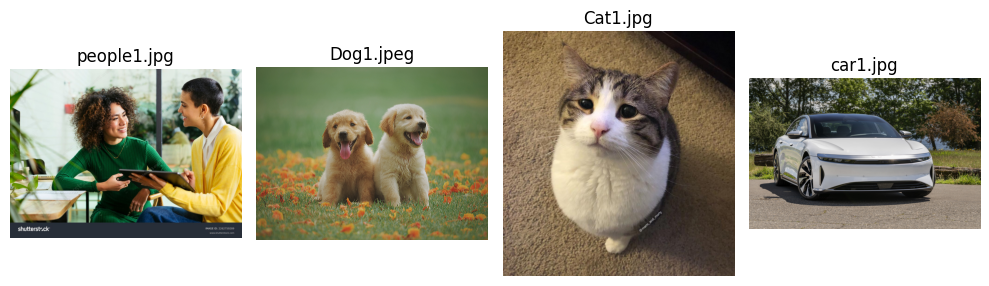

In [54]:
# Sử dụng hàm plot_images để vẽ ảnh
image_color_array = plot_images(image_array, image_path, columns=4, imgs=[])

## Low Pass Filter

In [55]:
# Define low-pass filter kernel (smoothing)
low_pass_kernel = np.array([[1, 1, 1],
                             [1, 1, 1],
                             [1, 1, 1]]) / 9

## High Pass Filter

In [56]:
# Define high-pass filter kernel (edge detection)
high_pass_kernel = np.array([[-1, -1, -1],
                              [-1,  8, -1],
                              [-1, -1, -1]])

## Add noise to Original Image

In [57]:
import cv2

In [63]:
def add_gaussian_noise_rgb(image, mean=0, std=25):

    noise = np.random.normal(mean, std, size=image.shape)
    noisy_image = np.clip(image + noise, 0, 255).astype(np.uint8)
    return noisy_image

In [87]:
def add_salt_and_pepper_noise(image, salt_prob=0.01, pepper_prob=0.01):

    noisy_image = np.copy(image)
    salt_mask = np.random.rand(*image.shape[:2]) < salt_prob
    pepper_mask = np.random.rand(*image.shape[:2]) < pepper_prob
    noisy_image[salt_mask] = 255
    noisy_image[pepper_mask] = 0
    return noisy_image

In [110]:
# image_noisy_array = [add_gaussian_noise_rgb(img, mean=100, std=25) for img in image_color_array]
image_noisy_array = [add_salt_and_pepper_noise(img, salt_prob=0.20, pepper_prob=0.40) for img in image_color_array]

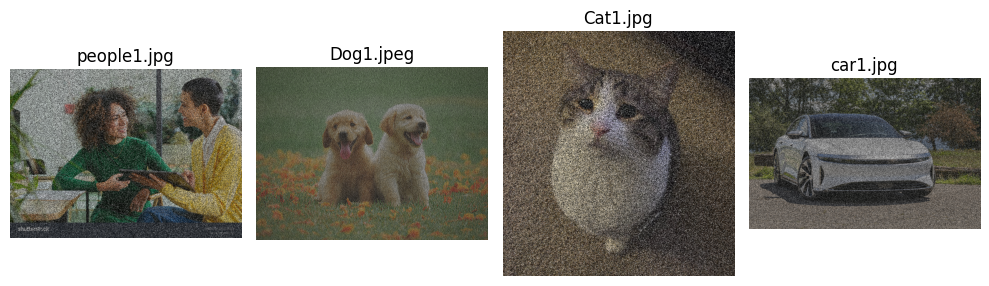

In [111]:
image_noisy_array = plot_images(image_array, image_path, columns=4, imgs=image_noisy_array)

## Apply Filter

In [99]:
import time
from scipy.signal import convolve2d

In [100]:
def conv2d(image, kernel, epoch=1, epochs=1):
  m, n = kernel.shape
  y, x, c = image.shape
  y = y - m + 1
  x = x - n + 1
  new_image = np.zeros((y, x, c))

  total_steps = y * x * c
  current_step = 0

  print(f"Epoch {epoch}/{epochs}")
  print("[", end="", flush=True)

  start_time = time.time()

  for i in range(y):
    for j in range(x):
      for k in range(c):

        new_image[i, j, k] = np.sum(image[i:i+m, j:j+n, k] * kernel)
        current_step += 1

        progress = current_step / total_steps
        elapsed_time = time.time() - start_time
        avg_time_per_step = elapsed_time / current_step
        remaining_steps = total_steps - current_step
        remaining_time = remaining_steps * avg_time_per_step

        print(f"Progress: {progress*100:.2f}% - ETA: {remaining_time:.2f}s", end="\r", flush=True)

  print("] - 100.00% - Total time: {:.2f}s".format(time.time() - start_time))
  return new_image

In [101]:
def conv2d(image, kernel, epoch=1, epochs=1):
    print(f"Epoch {epoch}/{epochs}", end=" ")
    print("[", end="", flush=True)

    start_time = time.time()

    # Iterate over each channel and convolve with the kernel
    new_image = np.zeros_like(image)
    for c in range(image.shape[2]):
        new_image[:, :, c] = convolve2d(image[:, :, c], kernel, mode='same', boundary='wrap')
        print("#", end="", flush=True)

    print("] - 100.00% - Total time: {:.2f}s".format(time.time() - start_time))

    return new_image

In [112]:
# Apply Low Pass Filter
low_pass_images = [conv2d(img, low_pass_kernel,
                              epoch=index + 1,
                              epochs=len(image_noisy_array))
                      for index, img in enumerate(image_noisy_array)
                   ]

Epoch 1/4 [###] - 100.00% - Total time: 0.27s
Epoch 2/4 [###] - 100.00% - Total time: 3.51s
Epoch 3/4 [###] - 100.00% - Total time: 0.18s
Epoch 4/4 [###] - 100.00% - Total time: 0.42s


In [113]:
# Apply High Pass Filter
high_pass_images = [conv2d(img, high_pass_kernel,
                              epoch=index,
                              epochs=len(image_color_array))
                      for index, img in enumerate(image_color_array)
                   ]

Epoch 0/4 [###] - 100.00% - Total time: 0.29s
Epoch 1/4 [###] - 100.00% - Total time: 4.87s
Epoch 2/4 [###] - 100.00% - Total time: 0.29s
Epoch 3/4 [###] - 100.00% - Total time: 0.43s


## Plot Result

In [114]:
# Hiển thị ảnh gốc, ảnh xám và ảnh màu từ ảnh xám
def plot_multiple_images(original_images, noisy_images, low_pass_images, high_pass_images):
    num_images = len(original_images)
    num_cols = 4
    num_rows = num_images

    plt.figure(figsize=(20, 5*num_rows))

    for i in range(num_images):
        plt.subplot(num_rows, num_cols, i*num_cols + 1)
        plt.imshow(original_images[i])
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(num_rows, num_cols, i*num_cols + 2)
        plt.imshow(noisy_images[i])
        plt.title('Noisy Image')
        plt.axis('off')

        plt.subplot(num_rows, num_cols, i*num_cols + 3)
        plt.imshow(low_pass_images[i], cmap='gray')
        plt.title('Low Pass Filter Image')
        plt.axis('off')

        plt.subplot(num_rows, num_cols, i*num_cols + 4)
        plt.imshow(high_pass_images[i])
        plt.title('High Pass Filter')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

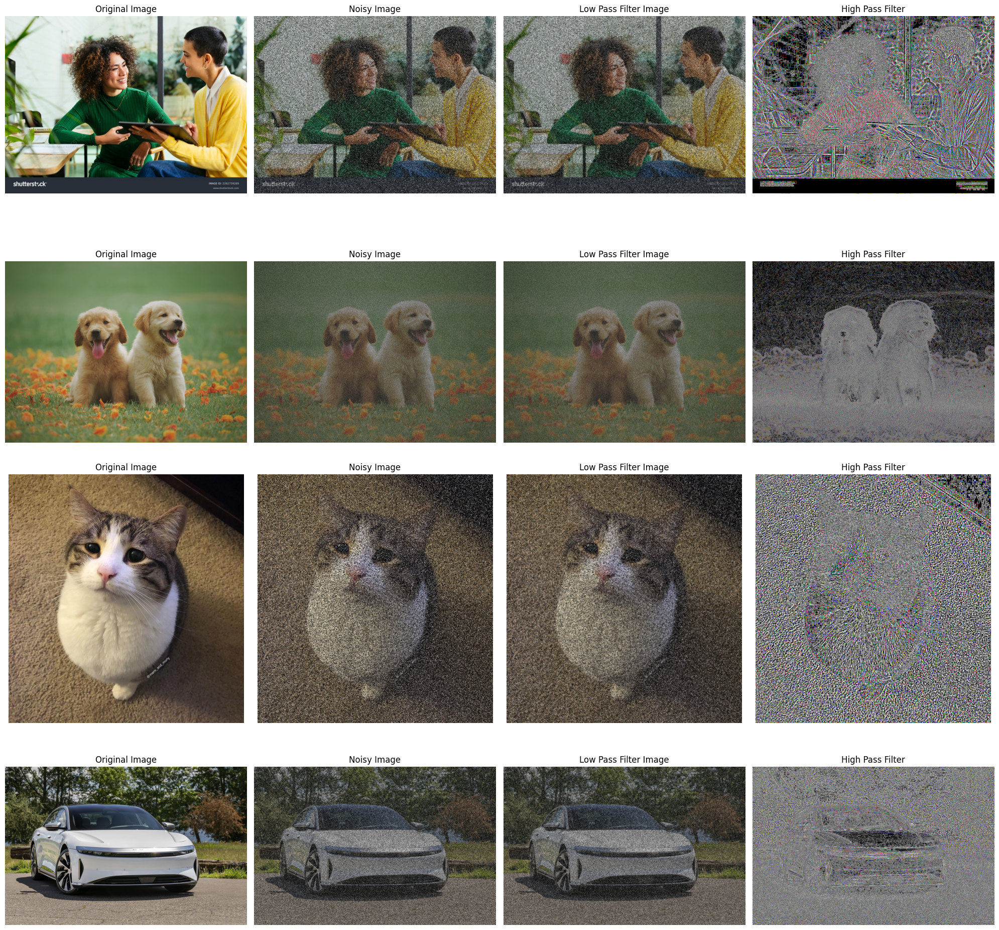

In [115]:
plot_multiple_images(image_color_array, image_noisy_array,low_pass_images, high_pass_images)